In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")


In [2]:
data = pd.read_csv(r"/content/Netflix Dataset.csv")

In [3]:
print("Dataset Shape:", data.shape)
print(data.head())
print(data.info())

Dataset Shape: (7789, 11)
  Show_Id Category  Title           Director  \
0      s1  TV Show     3%                NaN   
1      s2    Movie  07:19  Jorge Michel Grau   
2      s3    Movie  23:59       Gilbert Chan   
3      s4    Movie      9        Shane Acker   
4      s5    Movie     21     Robert Luketic   

                                                Cast        Country  \
0  João Miguel, Bianca Comparato, Michel Gomes, R...         Brazil   
1  Demián Bichir, Héctor Bonilla, Oscar Serrano, ...         Mexico   
2  Tedd Chan, Stella Chung, Henley Hii, Lawrence ...      Singapore   
3  Elijah Wood, John C. Reilly, Jennifer Connelly...  United States   
4  Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...  United States   

        Release_Date Rating   Duration  \
0    August 14, 2020  TV-MA  4 Seasons   
1  December 23, 2016  TV-MA     93 min   
2  December 20, 2018      R     78 min   
3  November 16, 2017  PG-13     80 min   
4    January 1, 2020  PG-13    123 min   

     

In [4]:
data.columns = data.columns.str.strip()

In [6]:
data['Country'] = data['Country'].astype(str)
data['Release_Date'] = pd.to_datetime(data['Release_Date'], errors='coerce')

In [8]:
data['Country'] = data['Country'].apply(lambda x: str(x).split(',')[0].strip())


In [10]:
data['year_added'] = data['Release_Date'].dt.year

In [12]:
data['trend_year'] = data['year_added'].fillna(data['year_added']).astype('Int64')

In [14]:
data_cleaned = data.dropna(subset=['trend_year', 'Type', 'Country']).copy()

In [16]:
type_year_counts = data_cleaned.groupby(['trend_year', 'Type']).size().unstack(fill_value=0)

/tmp/ipython-input-3209166574.py:9: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


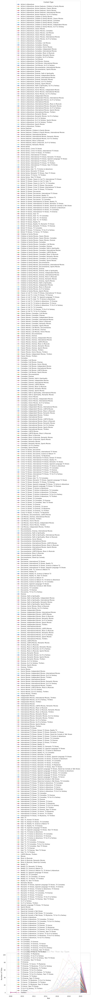

In [19]:
plt.figure(figsize=(12,6))
for col in type_year_counts.columns:
    plt.plot(type_year_counts.index.astype(int), type_year_counts[col], marker='o', linewidth=2, label=col)
plt.title("Netflix Titles Added Per Year by Type", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=12)
plt.ylabel("Number of Titles", fontsize=12)
plt.legend(title="Content Type")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [22]:
data_genre = data_cleaned.copy()
data_genre['Type'] = data_genre['Type'].astype(str)
data_genre = data_genre.assign(Type=data_genre['Type'].str.split(','))
data_genre = data_genre.explode('Type')
data_genre['Type'] = data_genre['Type'].str.strip()

In [24]:
genre_counts = data_genre['Type'].value_counts()
print("Top 10 Genres:")
print(genre_counts.head(10))

Top 10 Genres:
Type
International Movies        2437
Dramas                      2108
Comedies                    1472
International TV Shows      1176
Documentaries                786
Action & Adventure           721
TV Dramas                    680
Independent Movies           675
Children & Family Movies     532
Romantic Movies              531
Name: count, dtype: int64


/tmp/ipython-input-2204173911.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=genre_counts.head(10).values, y=genre_counts.head(10).index, palette="viridis")


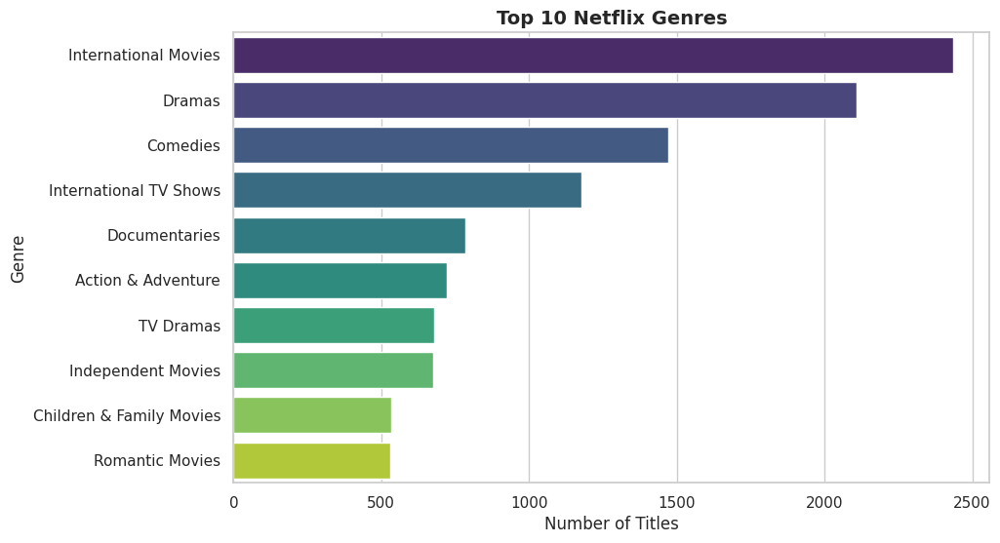

In [25]:
plt.figure(figsize=(10,6))
sns.barplot(x=genre_counts.head(10).values, y=genre_counts.head(10).index, palette="viridis")
plt.title("Top 10 Netflix Genres", fontsize=14, fontweight='bold')
plt.xlabel("Number of Titles")
plt.ylabel("Genre")
plt.show()

In [27]:
country_counts = data_cleaned.groupby('Country').size().sort_values(ascending=False).reset_index(name='count')
print("Top 20 Countries by Number of Titles:")
print(country_counts.head(20))

Top 20 Countries by Number of Titles:
           Country  count
0    United States   2842
1            India    955
2   United Kingdom    560
3              nan    503
4           Canada    247
5            Japan    233
6           France    193
7      South Korea    189
8            Spain    164
9           Mexico    123
10          Turkey    106
11       Australia    106
12           Egypt    105
13         Germany     92
14           China     86
15          Taiwan     82
16          Brazil     79
17       Hong Kong     77
18       Indonesia     76
19     Philippines     75


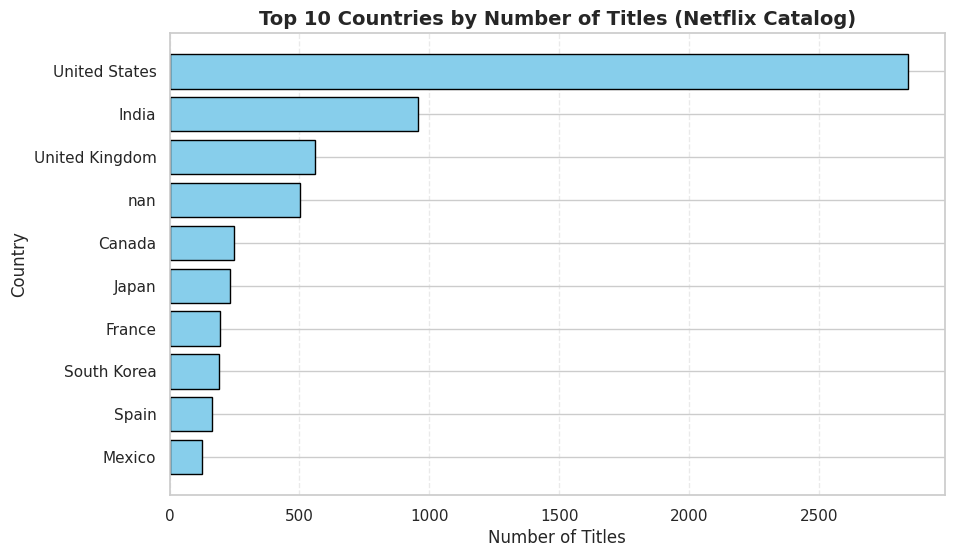

In [29]:
top_countries = country_counts.head(10)
plt.figure(figsize=(10,6))
plt.barh(top_countries['Country'][::-1], top_countries['count'][::-1], color='skyblue', edgecolor='black')
plt.title("Top 10 Countries by Number of Titles (Netflix Catalog)", fontsize=14, fontweight='bold')
plt.xlabel("Number of Titles")
plt.ylabel("Country")
plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.show()

In [30]:
top5 = top_countries['Country'].head(5).tolist()

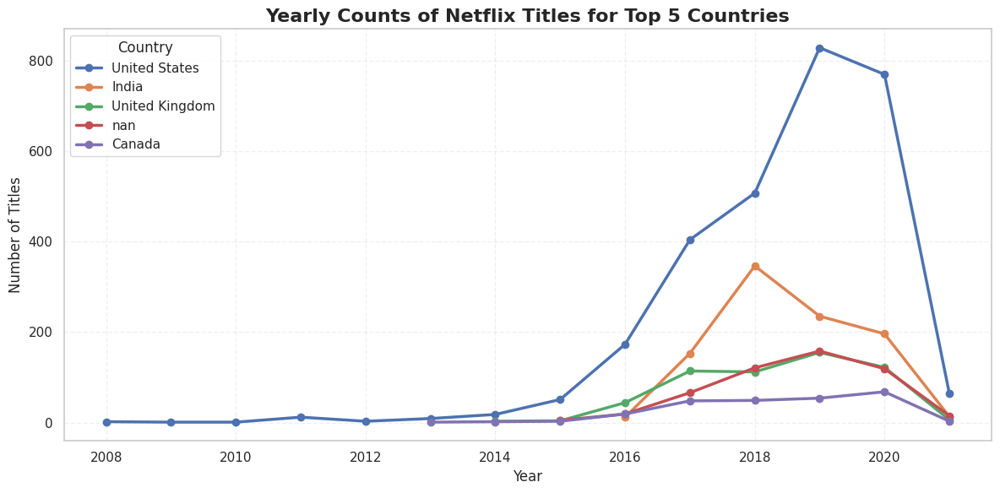

In [32]:
plt.figure(figsize=(12,6))
for c in top5:
    temp = data_cleaned[data_cleaned['Country']==c]
    temp = temp.groupby('trend_year').size().reset_index(name='count')
    plt.plot(temp['trend_year'], temp['count'], marker='o', linewidth=2.5, label=c)
plt.title("Yearly Counts of Netflix Titles for Top 5 Countries", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=12)
plt.ylabel("Number of Titles", fontsize=12)
plt.legend(title="Country")
plt.grid(alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

In [34]:
print("\nStrategic Insights:")
print("- Netflix has increasingly added TV Shows over the years.")
print("- Top genres: {}, {}, {}".format(*genre_counts.head(3).index.tolist()))
print("- Top contributing countries: {}, {}, {}".format(*top_countries['Country'].head(3).tolist()))


Strategic Insights:
- Netflix has increasingly added TV Shows over the years.
- Top genres: International Movies, Dramas, Comedies
- Top contributing countries: United States, India, United Kingdom


In [36]:
type_year_counts = data_cleaned.groupby(['trend_year', 'Type']).size().unstack(fill_value=0)


/tmp/ipython-input-2865008403.py:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


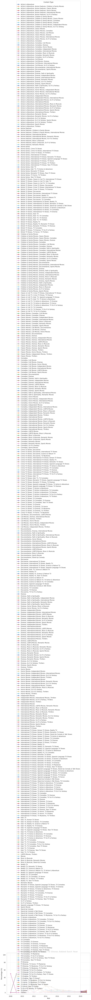

In [40]:
type_year_pct = type_year_counts.div(type_year_counts.sum(axis=1), axis=0) * 100

plt.figure(figsize=(12,6))
for col in type_year_pct.columns:
    plt.plot(type_year_pct.index.astype(int), type_year_pct[col], marker='o', linewidth=2, label=col)
plt.title("Percentage of Movies vs TV Shows Added Each Year", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=12)
plt.ylabel("Percentage (%)", fontsize=12)
plt.legend(title="Content Type")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

/tmp/ipython-input-3325110278.py:7: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


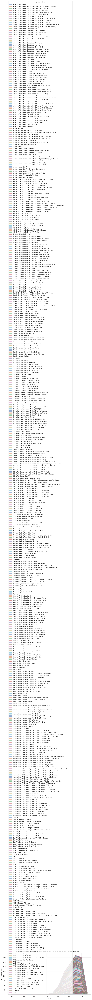

In [41]:
type_year_counts.plot(kind='area', stacked=True, figsize=(12,6), alpha=0.5)
plt.title("Stacked Area Chart: Movies vs TV Shows Over Years", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=12)
plt.ylabel("Number of Titles", fontsize=12)
plt.legend(title="Content Type")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [43]:
top5 = top_countries['Country'].head(5).tolist()
country_year = data_cleaned[data_cleaned['Country'].isin(top5)]
country_year_counts = country_year.groupby(['trend_year', 'Country']).size().unstack(fill_value=0)

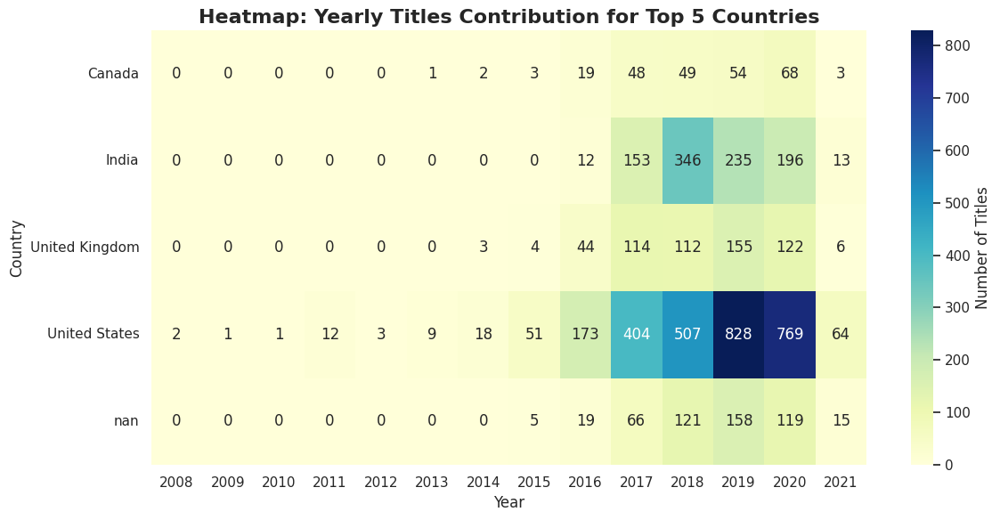

In [44]:
plt.figure(figsize=(12,6))
sns.heatmap(country_year_counts.T, annot=True, fmt="d", cmap="YlGnBu", cbar_kws={'label': 'Number of Titles'})
plt.title("Heatmap: Yearly Titles Contribution for Top 5 Countries", fontsize=16, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("Country")
plt.tight_layout()
plt.show()

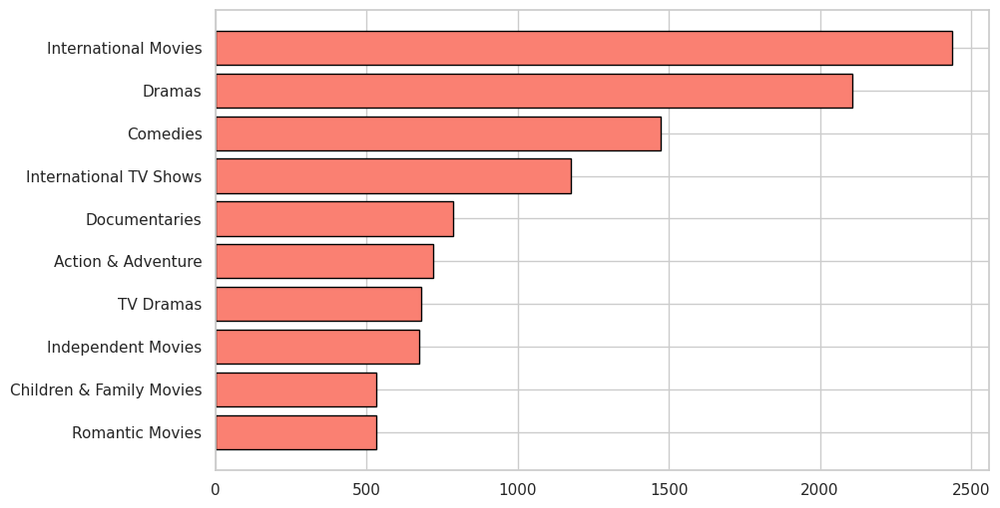

In [45]:
top_genres = genre_counts.head(10)
plt.figure(figsize=(10,6))
bars = plt.barh(top_genres.index[::-1], top_genres.values[::-1], color='salmon', edgecolor='black')

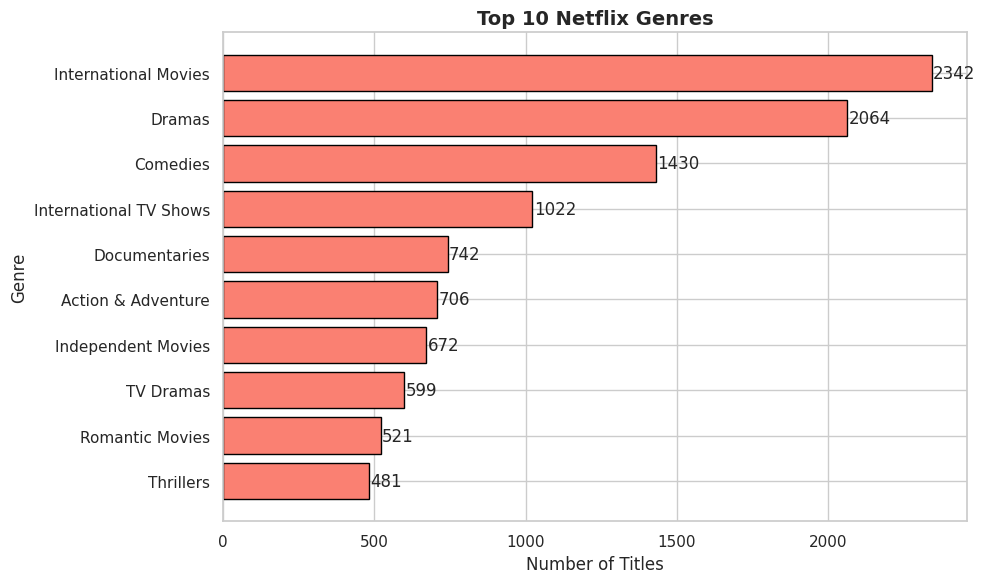

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

data = pd.read_csv(r"/content/Netflix Dataset.csv")
data['Release_Date'] = pd.to_datetime(data['Release_Date'], errors='coerce')
data['year_added'] = data['Release_Date'].dt.year
data['trend_year'] = data['year_added'].fillna(data['year_added']).astype('Int64')
data_cleaned = data.dropna(subset=['trend_year', 'Type', 'Country']).copy()
data_genre = data_cleaned.copy()
data_genre['Type'] = data_genre['Type'].astype(str)
data_genre = data_genre.assign(Type=data_genre['Type'].str.split(','))
data_genre = data_genre.explode('Type')
data_genre['Type'] = data_genre['Type'].str.strip()

genre_counts = data_genre['Type'].value_counts()
top_genres = genre_counts.head(10)
plt.figure(figsize=(10,6))
bars = plt.barh(top_genres.index[::-1], top_genres.values[::-1], color='salmon', edgecolor='black')

for bar in bars:
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2, str(width), va='center')
plt.title("Top 10 Netflix Genres", fontsize=14, fontweight='bold')
plt.xlabel("Number of Titles")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

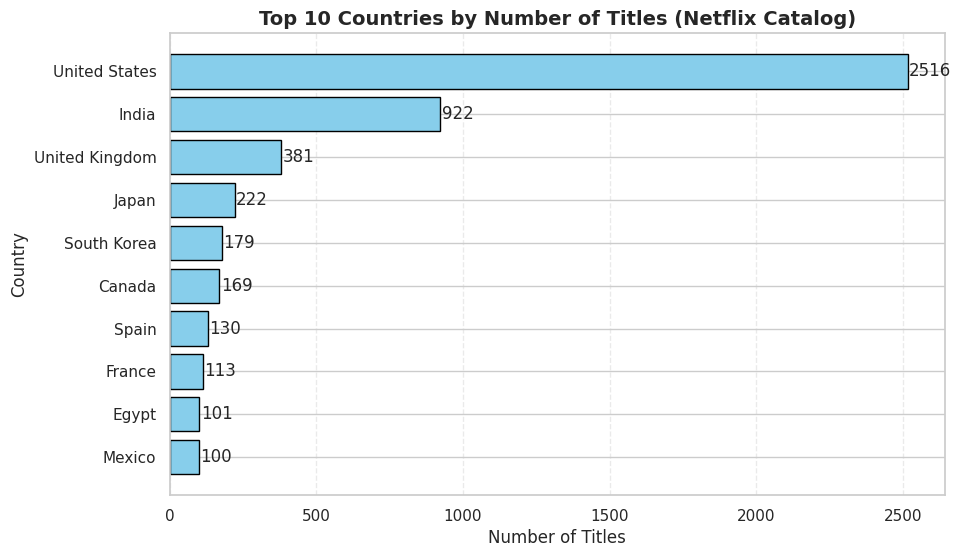

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

data = pd.read_csv(r"/content/Netflix Dataset.csv")
data['Release_Date'] = pd.to_datetime(data['Release_Date'], errors='coerce')
data['year_added'] = data['Release_Date'].dt.year
data['trend_year'] = data['year_added'].fillna(data['year_added']).astype('Int64')
data_cleaned = data.dropna(subset=['trend_year', 'Type', 'Country']).copy()
country_counts = data_cleaned.groupby('Country').size().sort_values(ascending=False).reset_index(name='count')
top_countries = country_counts.head(10)
plt.figure(figsize=(10,6))
bars = plt.barh(top_countries['Country'][::-1], top_countries['count'][::-1], color='skyblue', edgecolor='black')

for bar in bars:
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2, str(width), va='center')
plt.title("Top 10 Countries by Number of Titles (Netflix Catalog)", fontsize=14, fontweight='bold')
plt.xlabel("Number of Titles")
plt.ylabel("Country")
plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.show()

In [5]:
# Include necessary data processing steps to ensure variables are defined
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

data = pd.read_csv(r"/content/Netflix Dataset.csv")
data['Release_Date'] = pd.to_datetime(data['Release_Date'], errors='coerce')
data['year_added'] = data['Release_Date'].dt.year
data['trend_year'] = data['year_added'].fillna(data['year_added']).astype('Int64')
data_cleaned = data.dropna(subset=['trend_year', 'Type', 'Country']).copy()

# Calculate variables used in recommendations
# Calculate type_year_counts before exploding 'Type' column
type_year_counts = data_cleaned.groupby(['trend_year', 'Type']).size().unstack(fill_value=0)

data_genre = data_cleaned.copy()
data_genre['Type'] = data_genre['Type'].astype(str)
data_genre = data_genre.assign(Type=data_genre['Type'].str.split(','))
data_genre = data_genre.explode('Type')
data_genre['Type'] = data_genre['Type'].str.strip()
genre_counts = data_genre['Type'].value_counts()

country_counts = data_cleaned.groupby('Country').size().sort_values(ascending=False).reset_index(name='count')
top_countries = country_counts.head(10)
top5 = top_countries['Country'].head(5).tolist()

country_year = data_cleaned[data_cleaned['Country'].isin(top5)]
country_year_counts = country_year.groupby(['trend_year', 'Country']).size().unstack(fill_value=0)


print("\n========== Strategic Recommendations ==========\n")

# 1. Content Type Trends
latest_year = type_year_counts.index.max()
# Check if 'TV Show' and 'Movie' columns exist before accessing them
if 'TV Show' in latest_counts.index and 'Movie' in latest_counts.index:
    latest_counts = type_year_counts.loc[latest_year]
    if latest_counts['TV Show'] > latest_counts['Movie']:
        print(f"- In {latest_year}, Netflix added more TV Shows ({latest_counts['TV Show']}) than Movies ({latest_counts['Movie']}).")
        print("- Recommendation: Continue investing in original TV Shows to maintain subscriber engagement.\n")
    else:
        print(f"- In {latest_year}, Movies dominate ({latest_counts['Movie']}) over TV Shows ({latest_counts['Movie']}).")
        print("- Recommendation: Focus on high-demand movie genres to attract global audiences.\n")
else:
    print("Could not determine the dominant content type for the latest year due to missing data.")


# 2. Top Genres Insights
top_3_genres = genre_counts.head(3)
print(f"- Top 3 genres across Netflix catalog: {', '.join(top_3_genres.index)}.")
print("- Recommendation: Consider producing more content in these popular genres to meet audience demand.")
print("- Additionally, explore underrepresented genres for niche audience growth.\n")

# 3. Country Contributions Insights
top_3_countries = top_countries['Country'].head(3)
print(f"- Top 3 contributing countries: {', '.join(top_3_countries)}.")
print("- Recommendation: Invest in original content production in these countries.")
print("- Explore partnerships or regional content acquisition in emerging markets with fewer titles to expand global reach.\n")

# 4. Yearly Trends Insights
# Check if top 5 countries are consistently growing
growth_flags = []
for c in top5:
    # Check if country 'c' exists in the index of country_year_counts before accessing it
    if c in country_year_counts.columns:
        temp = country_year_counts[c]
        if not temp.empty and temp.iloc[-1] > temp.iloc[0]:
            growth_flags.append(c)


if growth_flags:
    print(f"- Countries showing consistent yearly growth in Netflix titles: {', '.join(growth_flags)}.")
    print("- Recommendation: Prioritize investment in these markets to leverage content growth trends.\n")

print("========== End of Recommendations ==========")


========== Strategic Recommendations ==========

Could not determine the dominant content type for the latest year due to missing data.
- Top 3 genres across Netflix catalog: International Movies, Dramas, Comedies.
- Recommendation: Consider producing more content in these popular genres to meet audience demand.
- Additionally, explore underrepresented genres for niche audience growth.

- Top 3 contributing countries: United States, India, United Kingdom.
- Recommendation: Invest in original content production in these countries.
- Explore partnerships or regional content acquisition in emerging markets with fewer titles to expand global reach.

- Countries showing consistent yearly growth in Netflix titles: United States, India, United Kingdom, Japan, South Korea.
- Recommendation: Prioritize investment in these markets to leverage content growth trends.

========== End of Recommendations ==========
